<a href="https://colab.research.google.com/github/Hamza-benAmmar/Satellite-Imagery-/blob/main/satellite_imagery_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#Imports

In [ ]:
from scipy.io import loadmat
import plotly.express as px
from sklearn.decomposition import PCA
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import scipy
import os
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D
from keras.optimizers import SGD
from keras import backend as K
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Input, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn import preprocessing
import random
from random import shuffle
from skimage.transform import rotate
import scipy.ndimage
from tqdm import tqdm
base_path="/content/drive/Shareddrives/satellite imagery/"


#Data Visualization

## Data Loading

In [ ]:
paviaU=loadmat(base_path+"PaviaU.mat")['paviaU']
paviaU_gt=loadmat(base_path+"PaviaU_gt.mat")['paviaU_gt']

pavia=loadmat(base_path+"Pavia.mat")['pavia']
pavia_gt=loadmat(base_path+"Pavia_gt.mat")['pavia_gt']

indian_pines =loadmat(base_path+"Indian_pines_corrected.mat")['indian_pines_corrected']
indian_pines_gt = loadmat(base_path+"Indian_pines_gt.mat")['indian_pines_gt']

salinas = loadmat(base_path+"Salinas_corrected.mat")["salinas_corrected"]
salinas_gt = loadmat("/content/drive/Shareddrives/satellite imagery/Salinas_gt.mat")["salinas_gt"]

In [ ]:
def visualize_dataset_info(dataset_name, dataset, ground_truth):
    print(f"Dataset: {dataset_name}")
    print(f"Dimensions (width, height, bands): {dataset.shape}")
    print(f"Number of Bands: {dataset.shape[2]}")
    print(f"Ground Truth Classes: {np.unique(ground_truth)}")
    print()

## Data information

In [ ]:
datasets = [(indian_pines, indian_pines_gt, "Indian Pines"),
            (pavia, pavia_gt, "Pavia Centre"),
            (paviaU, paviaU_gt, "Pavia University"),
            (salinas , salinas_gt , "Salinas")
            ]
for dataset, ground_truth, dataset_name in datasets:
    visualize_dataset_info(dataset_name, dataset, ground_truth)

Dataset: Indian Pines
Dimensions (width, height, bands): (145, 145, 200)
Number of Bands: 200
Ground Truth Classes: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16]

Dataset: Pavia Centre
Dimensions (width, height, bands): (1096, 715, 102)
Number of Bands: 102
Ground Truth Classes: [0 1 2 3 4 5 6 7 8 9]

Dataset: Pavia University
Dimensions (width, height, bands): (610, 340, 103)
Number of Bands: 103
Ground Truth Classes: [0 1 2 3 4 5 6 7 8 9]

Dataset: Salinas
Dimensions (width, height, bands): (512, 217, 204)
Number of Bands: 204
Ground Truth Classes: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16]



### Distributions

In [ ]:
# Dictionary mapping class numbers to class names for each dataset
salinas_class_names = {
    0: "undefined",
    1: "Brocoli_green_weeds_1",
    2: "Brocoli_green_weeds_2",
    3: "Fallow",
    4: "Fallow_rough_plow",
    5: "Fallow_smooth",
    6: "Stubble",
    7: "Celery",
    8: "Grapes_untrained",
    9: "Soil_vinyard_develop",
    10: "Corn_senesced_green_weeds",
    11: "Lettuce_romaine_4wk",
    12: "Lettuce_romaine_5wk",
    13: "Lettuce_romaine_6wk",
    14: "Lettuce_romaine_7wk",
    15: "Vinyard_untrained",
    16: "Vinyard_vertical_trellis"
}

pavia_university_class_names = {
    0: "undefined",
    1: "Asphalt",
    2: "Meadows",
    3: "Gravel",
    4: "Trees",
    5: "Painted metal sheets",
    6: "Bare Soil",
    7: "Bitumen",
    8: "Self-Blocking Bricks",
    9: "Shadows"
}

pavia_centre_class_names = {
    0: "undefined",
    1: "Water",
    2: "Trees",
    3: "Asphalt",
    4: "Self-Blocking Bricks",
    5: "Bitumen",
    6: "Tiles",
    7: "Shadows",
    8: "Meadows",
    9: "Bare Soil"
}

indian_pines_class_names = {
    0: "undefined",
    1: "Alfalfa",
    2: "Corn-notill",
    3: "Corn-mintill",
    4: "Corn",
    5: "Grass-pasture",
    6: "Grass-trees",
    7: "Grass-pasture-mowed",
    8: "Hay-windrowed",
    9: "Oats",
    10: "Soybean-notill",
    11: "Soybean-mintill",
    12: "Soybean-clean",
    13: "Wheat",
    14: "Woods",
    15: "Buildings-Grass-Trees-Drives",
    16: "Stone-Steel-Towers"
}

In [ ]:

# Function to visualize class distribution with class names
def visualize_class_distribution_with_names(ground_truth, class_names_map):
    unique_classes, class_counts = np.unique(ground_truth, return_counts=True)
    class_names = [class_names_map[class_num] for class_num in unique_classes]
    plt.figure(figsize=(10, 6))
    plt.bar(class_names, class_counts)
    plt.xlabel('Class')
    plt.ylabel('Frequency')
    plt.title('Class Distribution')
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()


#### Pavia University

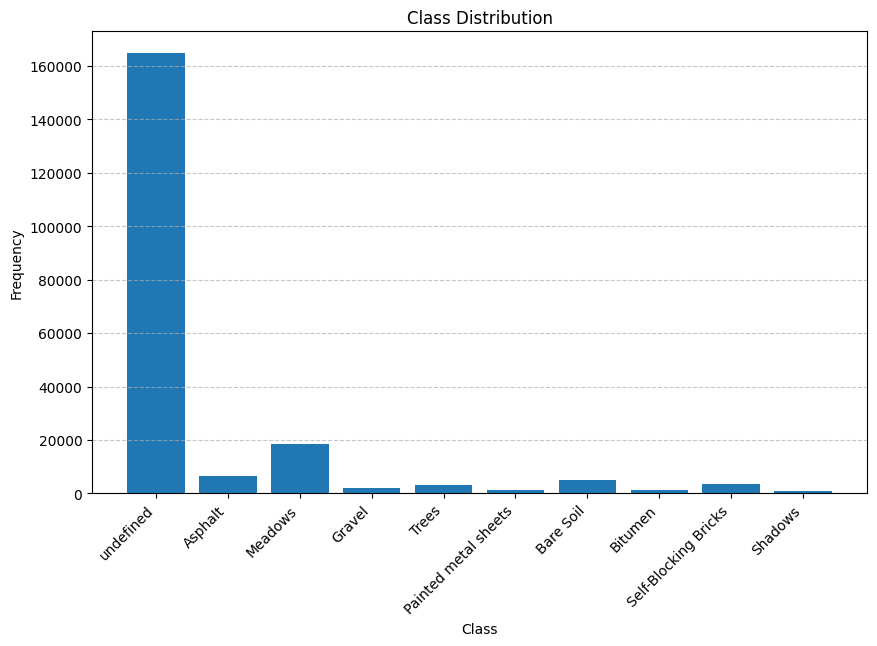

In [ ]:
# Visualizing class distributions with class names for each dataset
visualize_class_distribution_with_names(paviaU_gt, pavia_university_class_names)


#### Pavia Centre

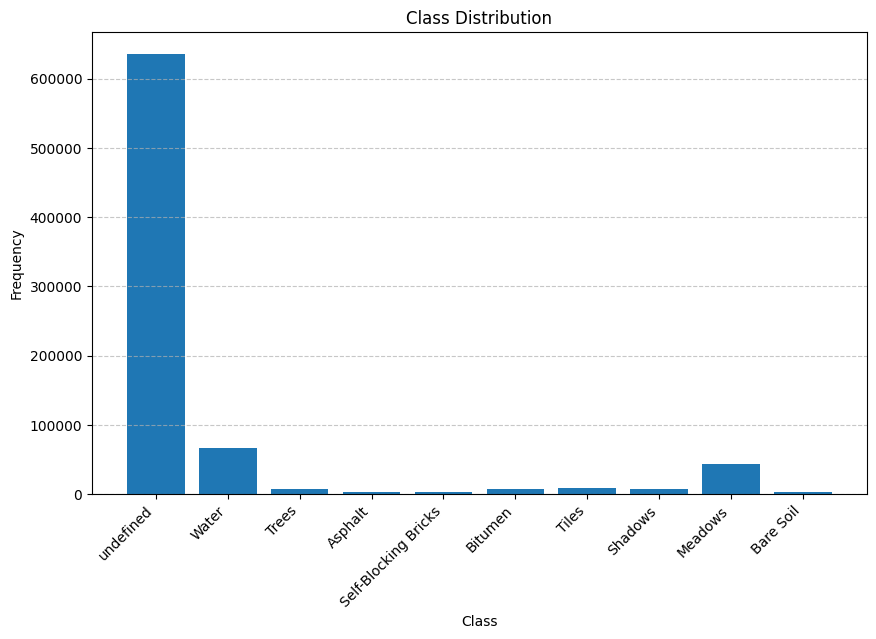

In [ ]:
visualize_class_distribution_with_names(pavia_gt, pavia_centre_class_names)

#### Indian Pines

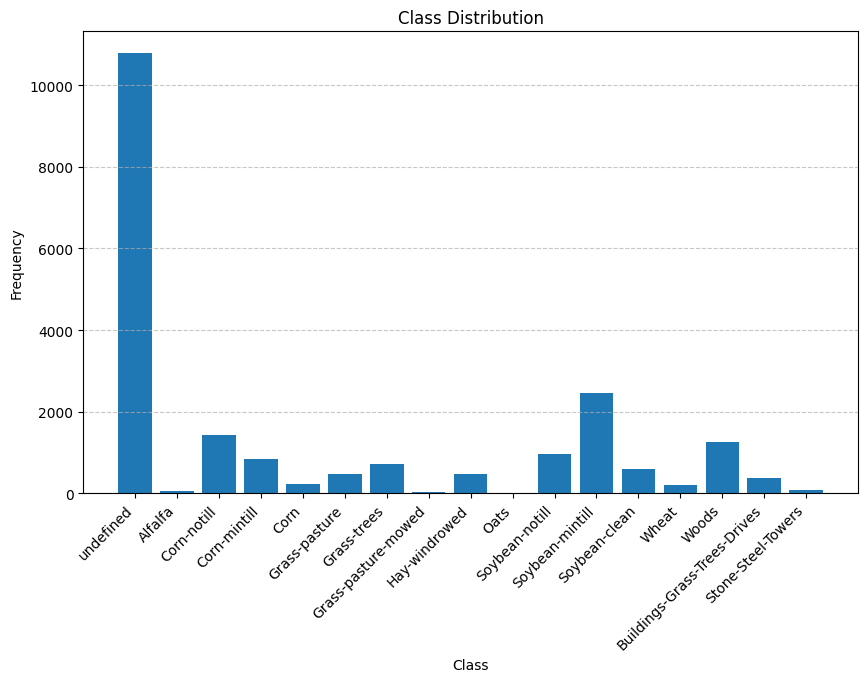

In [ ]:
visualize_class_distribution_with_names(indian_pines_gt, indian_pines_class_names)

#### Salinas

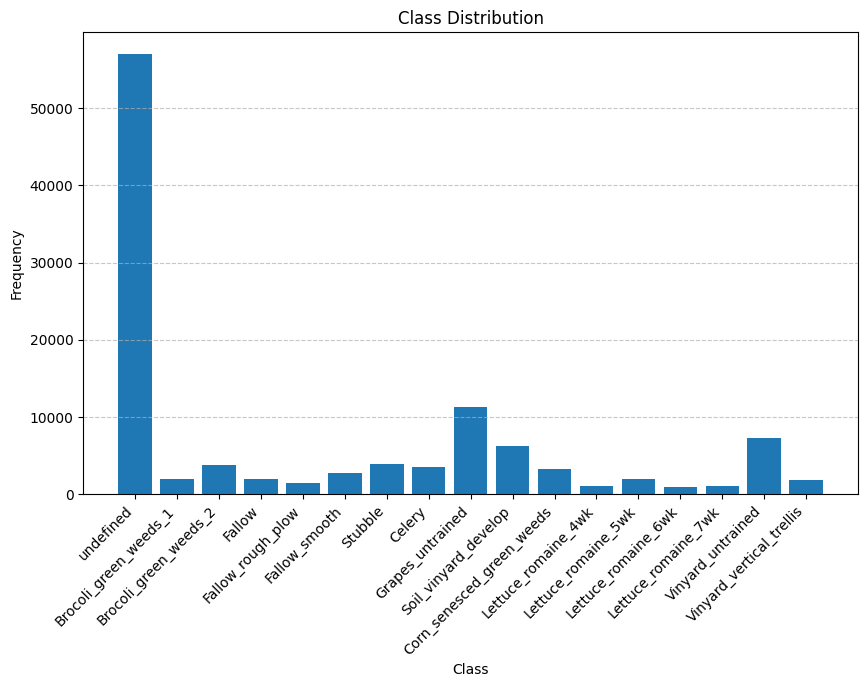

In [ ]:
visualize_class_distribution_with_names(salinas_gt, salinas_class_names)


## some bands of the satellite images

In [ ]:
def plot_bands(dataset, title):
    fig = plt.figure(figsize = (20, 12))
    ax = fig.subplots(2, 5)

    for i in range(2):
      for j in range(5):
        c = np.random.randint(103)
        ax[i][j].imshow(dataset[:, :, c], cmap='gray')
        ax[i][j].axis('off')
        ax[i][j].title.set_text(f"Band - {c}")
        c+=1

    plt.tight_layout()
    plt.show()



### Pavia University

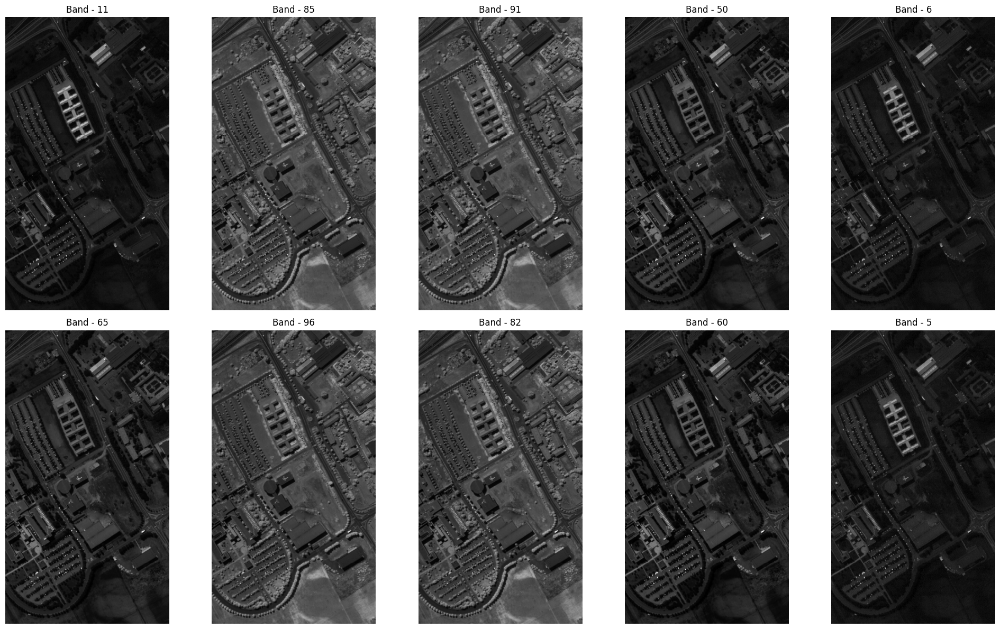

In [ ]:
plot_bands(paviaU, "PaviaU Dataset")

### Pavia Centre

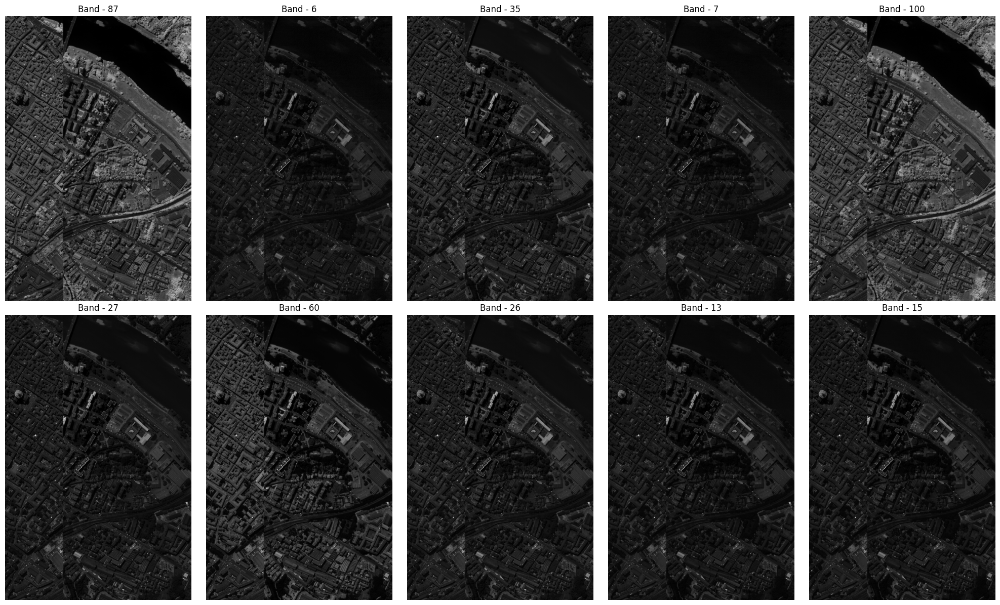

In [ ]:
plot_bands(pavia, "Pavia Dataset")

### Indian Pines

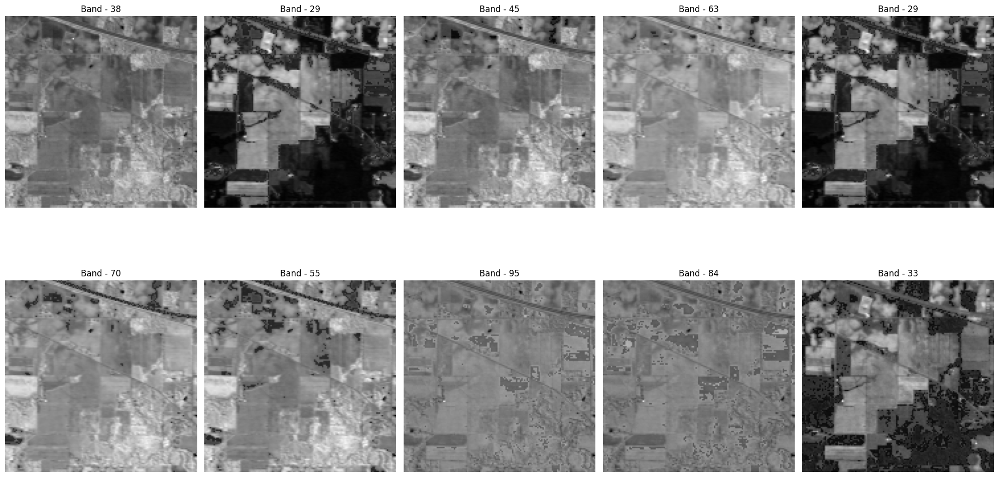

In [ ]:
plot_bands(indian_pines, "Indian Pines Dataset")

### Salinas

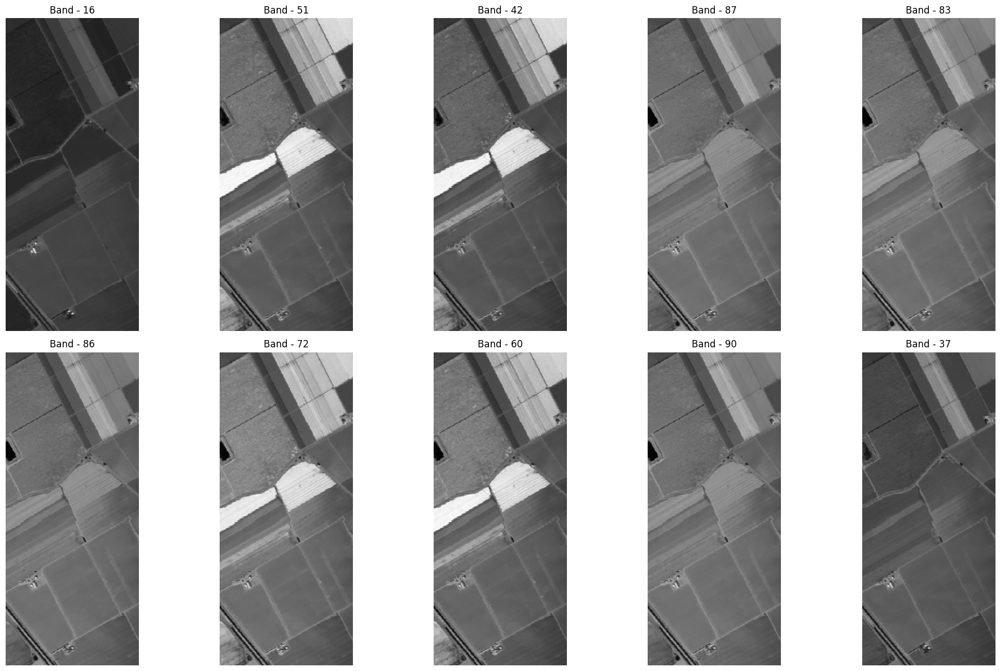

In [ ]:
plot_bands(salinas, "Salinas Dataset")

## Ground Truth

In [ ]:
def ground_truth(y):
  plt.figure(figsize=(8, 6))
  plt.imshow(y, cmap='jet')
  plt.colorbar(label='Class')
  plt.show()

###Pavia University

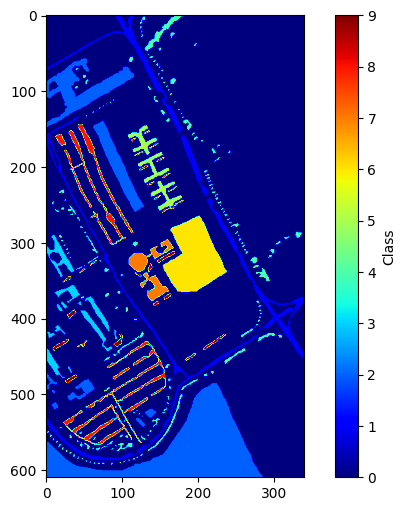

In [ ]:
ground_truth(paviaU_gt)

### Pavia Centre

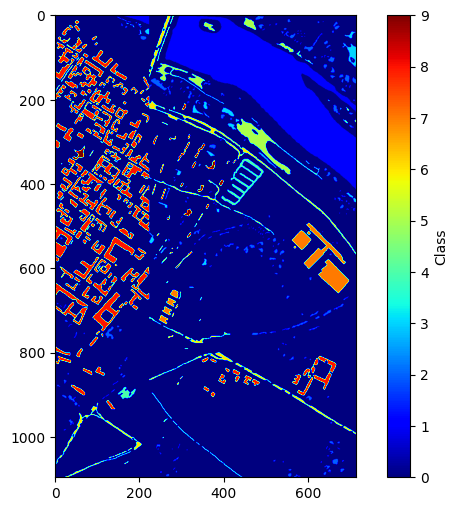

In [ ]:
ground_truth(pavia_gt)

### Indian Pines

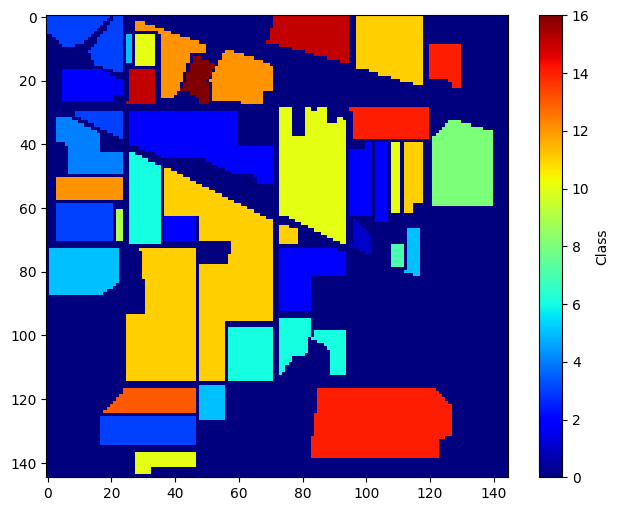

In [ ]:
ground_truth(indian_pines_gt)

### Salinas

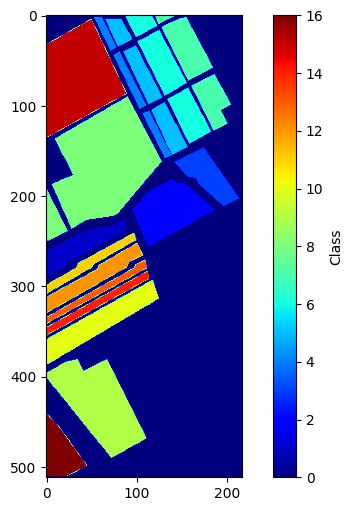

In [ ]:
ground_truth(salinas_gt)

## PCA

In [ ]:
def apply_pca(X, y, n_components=10):
    # Reshape X into a two-dimensional array
    n_samples, n_features, n_bands = X.shape
    X_flat = X.reshape((n_samples * n_features, n_bands))

    # Apply PCA
    pca = PCA(n_components=n_components)
    dt = pca.fit_transform(X_flat)
    pca_data_for_pseudo_color = dt.reshape((n_samples, n_features, n_components))
    # Create DataFrame for reduced data
    reduced_data = pd.DataFrame(data=dt, columns=[f'PC{i}' for i in range(1, n_components + 1)])
    reduced_data['class'] = y.ravel()
    explained_variance_ratio = pca.explained_variance_ratio_
    cumulative_variance_ratio = np.cumsum(explained_variance_ratio)
    plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, marker='o', linestyle='--')
    plt.xlabel('Number of Components')
    plt.ylabel('Cumulative Explained Variance Ratio')
    plt.title('Cumulative Explained Variance Ratio by Number of Components')
    plt.show()
    return reduced_data,pca_data_for_pseudo_color

#### Pavia University

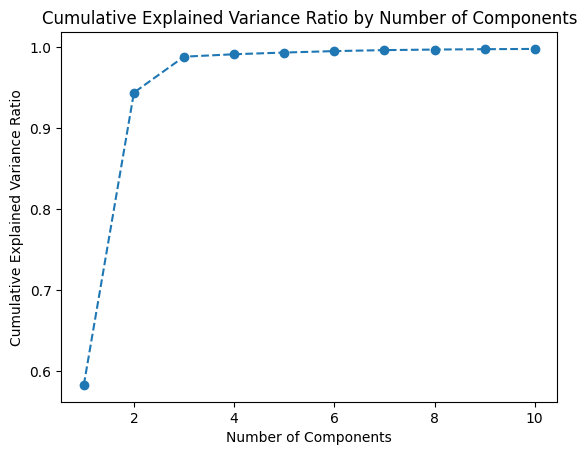

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,class
0,-5150.190044,6795.052770,1532.351461,410.030134,-259.856157,-832.898970,293.239776,278.385214,-285.609913,251.208753,0
1,-6082.245760,3158.592195,1463.194744,154.617093,-438.871878,-496.202149,362.925839,187.355434,-287.796733,180.614466,0
2,-7214.505405,1158.875812,1400.817899,410.044063,38.052916,-560.804196,-140.004203,8.847608,-211.057196,14.139079,0
3,-6566.279360,3398.894763,1126.024772,496.775042,-302.415250,-409.493899,218.391586,-2.957277,-223.380077,188.819704,0
4,-6496.967970,2154.797771,1035.954575,27.247705,-194.891403,-189.044607,-71.142484,-97.987805,-126.456170,215.182049,0
...,...,...,...,...,...,...,...,...,...,...,...
207395,-4315.315283,208.879103,-37.600057,-15.785801,116.620060,94.731463,-24.377063,-56.796093,-24.726143,-120.222016,0
207396,-4012.494488,685.248307,199.328731,55.691615,137.768056,98.122063,-20.840423,-305.353258,-69.463158,-224.923468,0
207397,-3975.035084,1643.062559,253.132178,-287.686124,114.539234,212.257349,-7.753115,-106.171030,80.450728,-58.222185,0
207398,-4042.639452,1231.520377,499.960314,-126.281001,-153.053615,288.243257,-33.275723,-206.172221,22.918280,-174.921789,0


In [ ]:
reduced_paviaU,reduced_paviaU_data=apply_pca(paviaU,paviaU_gt)
reduced_paviaU

#### Pavia Centre

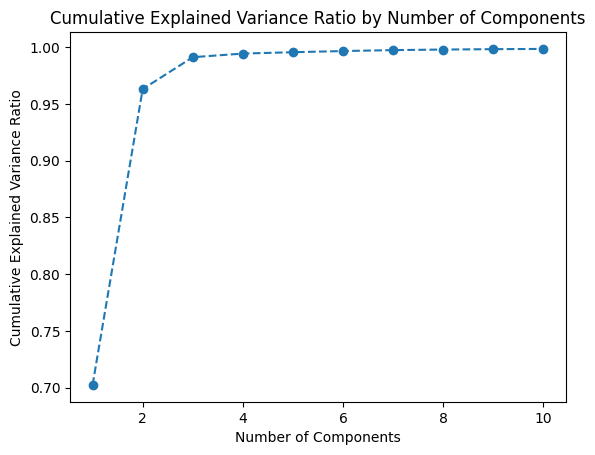

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,class
0,3903.296351,-10579.424391,969.223926,133.981938,-60.165558,-419.585371,-26.111761,230.439411,130.688673,-9.265976,0
1,4489.219702,-10495.362304,1200.288715,-120.391541,82.721431,-314.886175,213.728724,-168.935343,235.476952,-110.076503,0
2,7537.525472,-11984.664882,1063.019707,-516.632363,-82.281712,181.350808,-84.127047,176.169862,-14.802181,-139.919850,0
3,5856.807574,-10092.589084,1308.820550,-202.800970,67.710994,-354.438385,154.679931,-236.993144,28.491038,139.824452,0
4,7812.803615,-11935.049725,1544.780731,307.047887,-579.237495,-340.076493,-2.565575,126.552586,28.921934,10.033481,0
...,...,...,...,...,...,...,...,...,...,...,...
783635,344.641085,-7218.020858,926.371369,-156.115746,-180.275236,16.110583,-347.853655,76.198716,181.570703,-25.517170,0
783636,-2501.022210,-5406.711438,330.277938,-204.851259,378.260152,-72.556908,-91.337815,136.071821,210.112005,-31.294411,0
783637,947.076623,-6022.277158,192.120444,328.617617,96.312325,-82.994168,38.827172,-280.160655,70.157304,136.033223,0
783638,2686.873944,-5559.307416,146.715406,-299.043835,-43.272460,243.067418,60.805657,-105.155359,57.658926,-6.850937,0


In [ ]:
reduced_pavia,reduced_pavia_data=apply_pca(pavia,pavia_gt)
reduced_pavia

#### Indian Pines

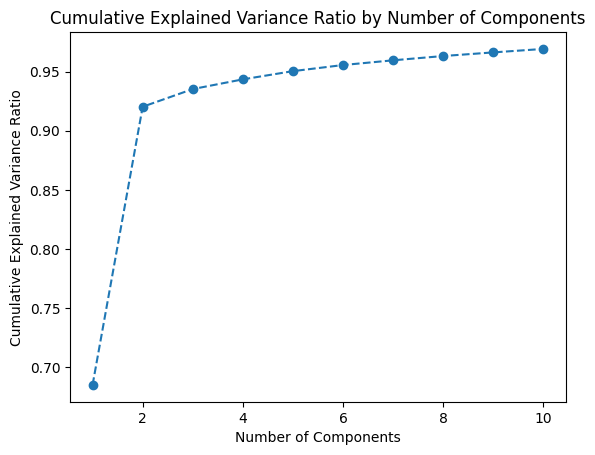

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,class
0,5014.905985,1456.863260,72.697049,71.204944,-435.686989,-68.839995,134.806817,-304.368090,256.454033,-66.619623,3
1,5601.383743,-2023.450087,350.134661,-528.465059,148.088305,-288.359623,202.958735,240.846027,-474.881728,93.493718,3
2,5796.135442,-3090.394852,490.539930,-760.214356,259.933309,-131.611384,172.929315,205.909513,572.476103,-191.628765,3
3,5586.204575,-2369.376085,356.274719,-502.687166,146.554958,-306.679778,251.073469,234.964380,-314.046670,54.957827,3
4,5020.990792,339.603390,-23.007525,-92.556767,-368.495440,-438.267098,502.715516,-345.536260,-188.363990,-67.502017,3
...,...,...,...,...,...,...,...,...,...,...,...
21020,-7487.553326,-1805.678548,277.584390,223.237084,-73.502121,-51.766834,307.175924,-310.173976,-413.965006,100.805258,0
21021,-7747.524119,-1831.909102,399.489872,91.054096,-398.538501,117.591288,366.731708,-207.217529,-249.126301,6.760610,0
21022,-7369.834198,-1132.381766,398.170226,94.132252,-359.553128,105.064823,360.167842,-151.536853,147.339590,6.571889,0
21023,-6497.087239,798.240033,676.808968,-196.894566,-766.926281,452.869642,254.770997,296.949567,214.507336,16.178106,0


In [ ]:
reduced_indian_pines,reduced_indian_pines_data=apply_pca(indian_pines,indian_pines_gt)
reduced_indian_pines

#### Salinas

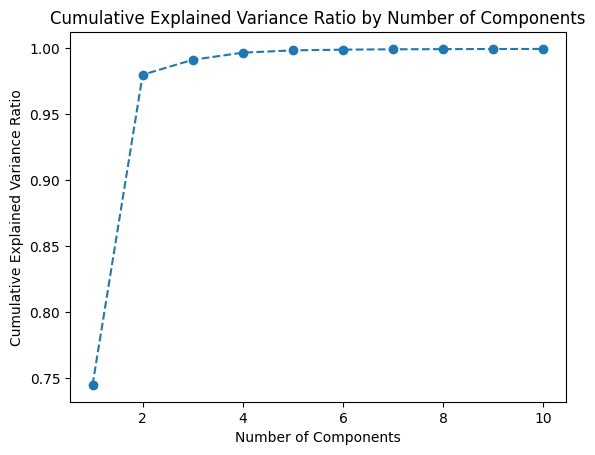

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,class
0,-6136.415770,-4385.651601,628.426690,-302.089387,-7.164320,48.222012,-129.801973,-28.045864,31.953504,69.756486,0
1,-6196.986718,-4360.590266,568.289463,-269.925094,-1.914969,-13.422142,-141.516132,-48.425747,56.946707,62.859607,0
2,-6359.538817,-4693.892811,578.047775,-286.413937,18.366365,-17.493501,-122.449201,-23.107800,27.357091,64.968537,0
3,-6583.700658,-5103.974489,630.466845,-313.787607,39.673922,-9.386642,-130.574810,-14.943107,24.519468,63.060339,0
4,-6834.644650,-5385.604040,666.876042,-327.332038,24.787586,-19.604360,-134.531359,-30.850479,28.726581,83.725040,0
...,...,...,...,...,...,...,...,...,...,...,...
111099,-6775.474571,-4038.470245,552.142554,148.512141,151.186060,32.580887,-31.099437,-56.804632,40.263373,26.496905,0
111100,-6774.761022,-4165.921895,584.737877,133.706533,152.864543,39.471971,-24.964615,-36.861132,9.892693,13.524435,0
111101,-6740.517719,-4127.147906,595.008085,114.590064,139.535660,7.656798,17.276998,26.566707,1.154692,27.425197,0
111102,-6763.546218,-4135.167926,579.176378,128.329374,145.436590,35.552630,-17.014588,-6.591298,-18.197556,15.380352,0


In [ ]:
reduced_salinas,reduced_salinas_data=apply_pca(salinas,salinas_gt)
reduced_salinas

## Correlations between first 3 principle components

In [ ]:
reduced_pavia['label'] = reduced_pavia['class'].apply(lambda x : pavia_centre_class_names[x])
reduced_paviaU['label'] = reduced_paviaU['class'].apply(lambda x : pavia_university_class_names[x])
reduced_indian_pines['label'] = reduced_indian_pines['class'].apply(lambda x : indian_pines_class_names[x])
reduced_salinas['label'] = reduced_salinas['class'].apply(lambda x : salinas_class_names[x])

In [ ]:
def plot_correlations(data,sample_size=200):
  sample = data.groupby('class').apply(lambda x: x.sample(sample_size))
  sample.head()
  pair = px.scatter_matrix(sample, dimensions=["PC1", "PC2", "PC3"], color="label")
  pair.show()
  scatter_3d = px.scatter_3d(sample, x="PC1", y="PC2", z="PC3", color="label", size="class", hover_name="label", symbol="label")
  scatter_3d.show()

#### Pavia Centre

In [ ]:
plot_correlations(reduced_pavia)

#### Pavia University

In [ ]:
plot_correlations(reduced_paviaU)

#### Indian Pines

In [ ]:
plot_correlations(reduced_indian_pines,sample_size=20)

#### Salinas

In [ ]:
plot_correlations(reduced_salinas,sample_size=200)

## PseudoColor Images

In [ ]:
def create_pseudocolor_image(pca_data, bands):
    # Use selected principal components for pseudocolor visualization
    pseudocolor_image = np.stack((pca_data[:,:,bands[0]], pca_data[:,:,bands[1]], pca_data[:,:,bands[2]]), axis=2)

    # Normalize the pseudocolor image data
    pseudocolor_image = np.clip(pseudocolor_image, 0, 1)  # Ensure values are within [0, 1]

    return pseudocolor_image

In [ ]:
# Parameters
pseudocolor_bands = [0, 1, 2]  # Bands for pseudocolor visualization

### Pavia University

In [ ]:
paviaU_pseudocolor = create_pseudocolor_image(reduced_paviaU_data, pseudocolor_bands)

(-0.5, 339.5, 609.5, -0.5)

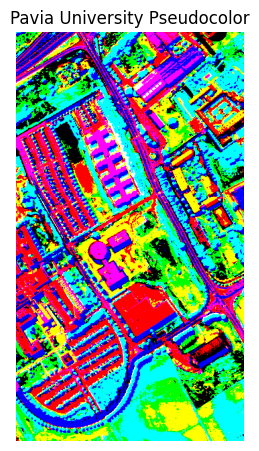

In [ ]:
plt.figure(figsize=(10, 8))

plt.subplot(131)
plt.imshow(paviaU_pseudocolor)
plt.title('Pavia University Pseudocolor')
plt.axis('off')

### Pavia Centre

In [ ]:
pavia_pseudocolor = create_pseudocolor_image(reduced_pavia_data, pseudocolor_bands)

(-0.5, 714.5, 1095.5, -0.5)

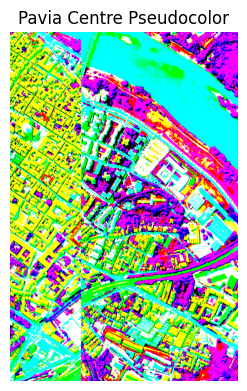

In [ ]:
plt.figure(figsize=(10, 8))

plt.subplot(132)
plt.imshow(pavia_pseudocolor)
plt.title('Pavia Centre Pseudocolor')
plt.axis('off')

### Indian Pines

In [ ]:
indian_pines_pseudocolor = create_pseudocolor_image(reduced_indian_pines_data, pseudocolor_bands)

(-0.5, 144.5, 144.5, -0.5)

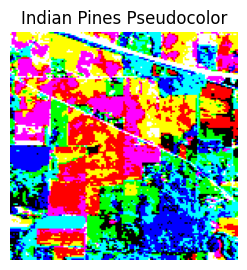

In [ ]:
plt.figure(figsize=(10, 8))

plt.subplot(132)
plt.imshow(indian_pines_pseudocolor)
plt.title('Indian Pines Pseudocolor')
plt.axis('off')

### Salinas

In [ ]:
salinas_pseudocolor = create_pseudocolor_image(reduced_salinas_data, pseudocolor_bands)

(-0.5, 216.5, 511.5, -0.5)

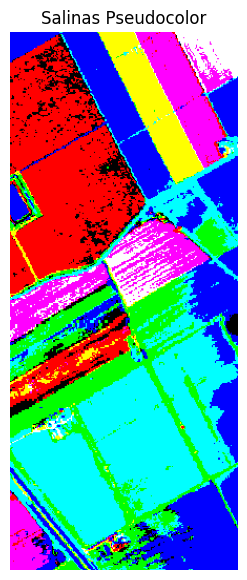

In [ ]:
plt.figure(figsize=(10, 8))

plt.subplot(132)
plt.imshow(salinas_pseudocolor)
plt.title('Salinas Pseudocolor')
plt.axis('off')

#Classification

In [ ]:
def save_keras_model(model, filename):
  # serialize model to JSON
  model_json = model.to_json()
  with open(filename+".json", "w") as json_file:
    json_file.write(model_json)
  # serialize weights to HDF5
  model.save_weights(filename+".h5")

In [ ]:
def preprocess_data(X, y):
    # Reshape y to match the number of pixels in X
    y_reshaped = y.reshape(-1)

    # Filter out rows where the class label is not equal to 0
    mask = (y_reshaped != 0)

    # Reshape X to 2D if it's not already
    if len(X.shape) == 3:
        X = X.reshape(-1, X.shape[-1])

    # Apply the mask to X and y
    X_filtered = X[mask]
    y_filtered = y_reshaped[mask]

    # Convert class labels to one-hot encoded format
    y_categorical = tf.keras.utils.to_categorical(y_filtered, num_classes=np.unique(y).shape[0], dtype="float32")

    return X_filtered, y_categorical

In [ ]:
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization

def create_and_train_model(X, y,model_name,epochs=50):
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=345, stratify=y)

    model = Sequential(name = model_name)

    model.add(Input(shape = X_train[0].shape, name = "Input_Layer"))

    model.add(BatchNormalization(name = "BatchNormalization"))

    model.add(Dense(units = 128, activation = "relu", name = "Layer1"))
    model.add(Dense(units = 128, activation = "relu", name = "Layer2"))
    model.add(Dense(units = 128, activation = "relu", name = "Layer3"))
    model.add(Dense(units = 128, activation = "relu", name = "Layer4"))

    model.add(Dropout(rate = 0.2, name = "Dropout1"))

    model.add(Dense(units = 64, activation = "relu", name = "Layer5"))
    model.add(Dense(units = 64, activation = "relu", name = "Layer6"))
    model.add(Dense(units = 64, activation = "relu", name = "Layer7"))
    model.add(Dense(units = 64, activation = "relu", name = "Layer8"))

    model.add(Dropout(rate = 0.2, name = "Dropout2"))

    model.add(Dense(units = 32, activation = "relu", name = "Layer9"))
    model.add(Dense(units = 32, activation = "relu", name = "Layer10"))
    model.add(Dense(units = 32, activation = "relu", name = "Layer11"))
    model.add(Dense(units = 32, activation = "relu", name = "Layer12"))

    model.add(Dense(units = y_train.shape[1], activation = "softmax", name = "Output_Layer"))

    # Compile the model
    model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])

    # Train the model
    history = model.fit(X_train, y_train, batch_size=128, epochs=epochs, validation_data=(X_test, y_test))

    return model, history



In [ ]:
def plot_results(history):
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train','test'], loc='upper left')
  plt.show()
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train','test'], loc='upper left')
  plt.show()

## Simple classification without CNN

### Pavia University

In [ ]:
X_paviaU,y_paviaU = preprocess_data(paviaU,paviaU_gt)
X_paviaU,y_paviaU

(array([[1447, 1113,  973, ..., 1660, 1643, 1610],
        [1203, 1304, 1402, ..., 1075, 1126, 1182],
        [1579, 1498, 1299, ..., 1137, 1145, 1161],
        ...,
        [ 758,  439,  489, ..., 2751, 2734, 2720],
        [1000,  741,  802, ..., 2870, 2895, 2899],
        [ 950,  644,  476, ..., 2688, 2699, 2736]], dtype=uint16),
 array([[0., 1., 0., ..., 0., 0., 0.],
        [0., 1., 0., ..., 0., 0., 0.],
        [0., 1., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.]], dtype=float32))

In [ ]:
paviaU_model,paviaU_history = create_and_train_model(X_paviaU,y_paviaU)

Epoch 1/50
268/268 [==============================] - 10s 8ms/step - loss: 0.8464 - accuracy: 0.6977 - val_loss: 0.5984 - val_accuracy: 0.7577
Epoch 2/50
268/268 [==============================] - 2s 7ms/step - loss: 0.5415 - accuracy: 0.7830 - val_loss: 0.4952 - val_accuracy: 0.8066
Epoch 3/50
268/268 [==============================] - 2s 7ms/step - loss: 0.4485 - accuracy: 0.8243 - val_loss: 0.3498 - val_accuracy: 0.8684
Epoch 4/50
268/268 [==============================] - 3s 9ms/step - loss: 0.4008 - accuracy: 0.8386 - val_loss: 0.3217 - val_accuracy: 0.8671
Epoch 5/50
268/268 [==============================] - 3s 9ms/step - loss: 0.3530 - accuracy: 0.8571 - val_loss: 0.2830 - val_accuracy: 0.8853
Epoch 6/50
268/268 [==============================] - 2s 7ms/step - loss: 0.3304 - accuracy: 0.8668 - val_loss: 0.2605 - val_accuracy: 0.8950
Epoch 7/50
268/268 [==============================] - 2s 7ms/step - loss: 0.2991 - accuracy: 0.8819 - val_loss: 0.2444 - val_accuracy: 0.9042
Epoch

In [ ]:
save_keras_model(paviaU_model,"/content/drive/Shareddrives/satellite imagery/paviaU_model")

In [ ]:
paviaU_model.summary()

Model: "Pavia_University"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 BatchNormalization (BatchN  (None, 103)               412       
 ormalization)                                                   
                                                                 
 Layer1 (Dense)              (None, 128)               13312     
                                                                 
 Layer2 (Dense)              (None, 128)               16512     
                                                                 
 Layer3 (Dense)              (None, 128)               16512     
                                                                 
 Layer4 (Dense)              (None, 128)               16512     
                                                                 
 Dropout1 (Dropout)          (None, 128)               0         
                                                  

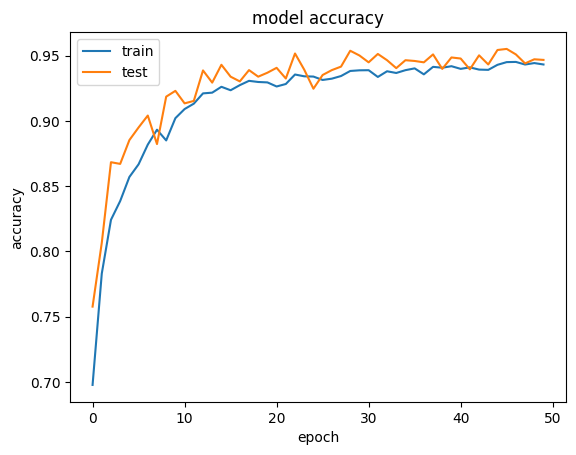

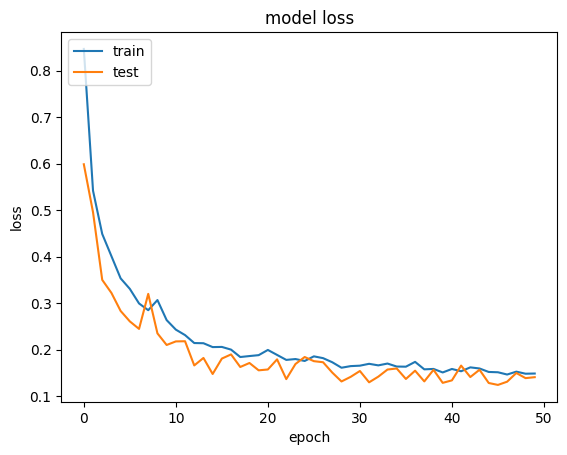

In [ ]:
plot_results(paviaU_history)

### Pavia University

In [ ]:
X_pavia,y_pavia = preprocess_data(pavia,pavia_gt)

In [ ]:
pavia_model,pavia_history = create_and_train_model(X_pavia,y_pavia)

Epoch 1/50
926/926 [==============================] - 11s 8ms/step - loss: 0.2296 - accuracy: 0.9221 - val_loss: 0.0872 - val_accuracy: 0.9676
Epoch 2/50
926/926 [==============================] - 7s 7ms/step - loss: 0.1029 - accuracy: 0.9641 - val_loss: 0.0717 - val_accuracy: 0.9736
Epoch 3/50
926/926 [==============================] - 9s 10ms/step - loss: 0.0912 - accuracy: 0.9674 - val_loss: 0.0889 - val_accuracy: 0.9635
Epoch 4/50
926/926 [==============================] - 8s 9ms/step - loss: 0.0860 - accuracy: 0.9688 - val_loss: 0.0671 - val_accuracy: 0.9748
Epoch 5/50
926/926 [==============================] - 8s 9ms/step - loss: 0.0971 - accuracy: 0.9652 - val_loss: 0.0791 - val_accuracy: 0.9773
Epoch 6/50
926/926 [==============================] - 9s 10ms/step - loss: 0.0794 - accuracy: 0.9713 - val_loss: 0.0584 - val_accuracy: 0.9791
Epoch 7/50
926/926 [==============================] - 7s 8ms/step - loss: 0.0737 - accuracy: 0.9737 - val_loss: 0.0650 - val_accuracy: 0.9753
Epo

In [ ]:
save_keras_model(pavia_model,"/content/drive/Shareddrives/satellite imagery/pavia_model")

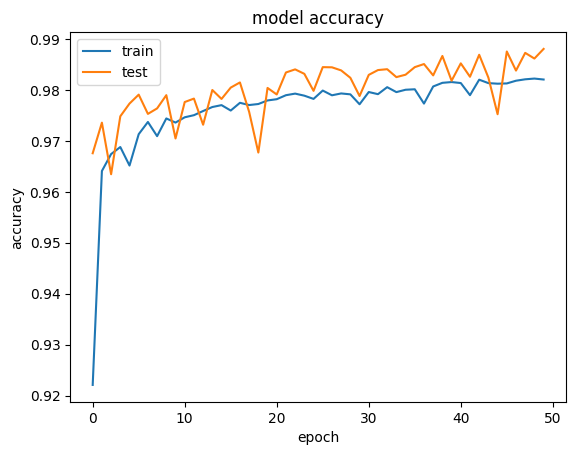

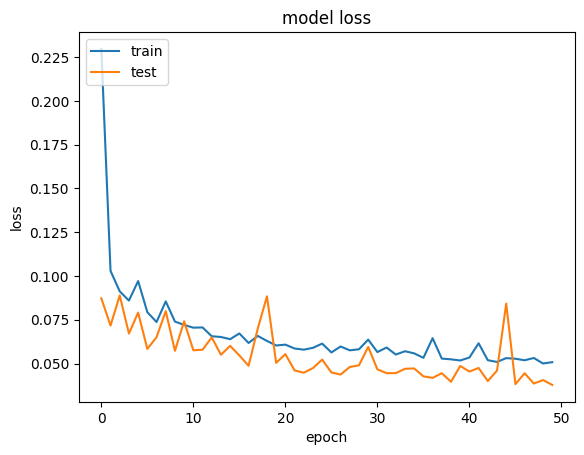

In [ ]:
plot_results(pavia_history)

### Indian Pines

In [ ]:
X_indian_pines,y_indian_pines=preprocess_data(indian_pines,indian_pines_gt)

In [ ]:
indian_pines_model,indian_pines_history = create_and_train_model(X_indian_pines,y_indian_pines,"indian_pines_model",epochs=100)

Epoch 1/100
65/65 [==============================] - 4s 11ms/step - loss: 2.1719 - accuracy: 0.3360 - val_loss: 15.2073 - val_accuracy: 0.2395
Epoch 2/100
65/65 [==============================] - 1s 10ms/step - loss: 1.5606 - accuracy: 0.4559 - val_loss: 8.4120 - val_accuracy: 0.2395
Epoch 3/100
65/65 [==============================] - 2s 24ms/step - loss: 1.3827 - accuracy: 0.4999 - val_loss: 2.3590 - val_accuracy: 0.3971
Epoch 4/100
65/65 [==============================] - 1s 16ms/step - loss: 1.2332 - accuracy: 0.5570 - val_loss: 2.0080 - val_accuracy: 0.4146
Epoch 5/100
65/65 [==============================] - 1s 10ms/step - loss: 1.0977 - accuracy: 0.6018 - val_loss: 1.4941 - val_accuracy: 0.5059
Epoch 6/100
65/65 [==============================] - 1s 10ms/step - loss: 1.0632 - accuracy: 0.6135 - val_loss: 1.1613 - val_accuracy: 0.6151
Epoch 7/100
65/65 [==============================] - 1s 8ms/step - loss: 1.0113 - accuracy: 0.6359 - val_loss: 1.0989 - val_accuracy: 0.6283
Epoch 

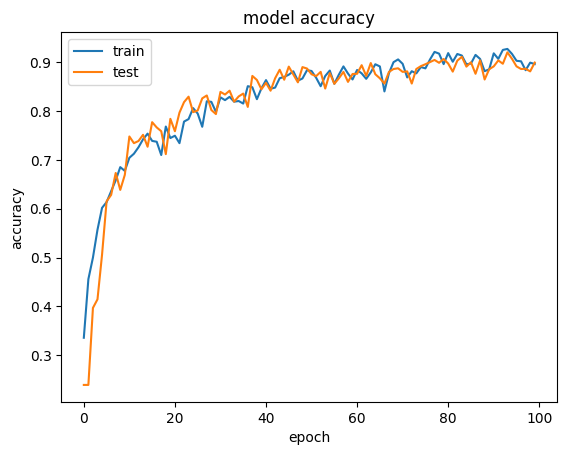

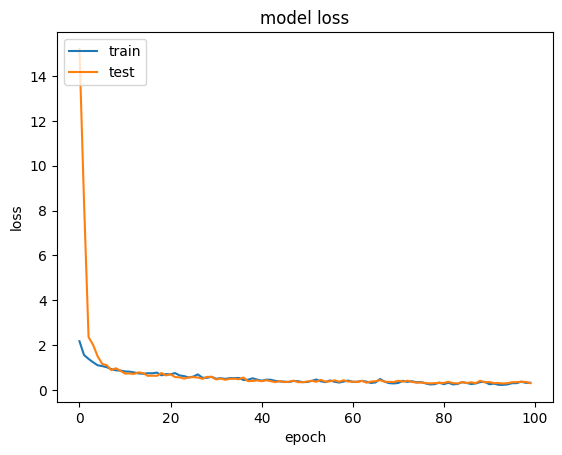

In [ ]:
plot_results(indian_pines_history)

In [ ]:
save_keras_model(indian_pines_model,"/content/drive/Shareddrives/satellite imagery/indian_pines_model")

### Salinas

In [ ]:
X_salinas,y_salinas = preprocess_data(salinas,salinas_gt)

In [ ]:
salinas_model,salinas_history = create_and_train_model(X_salinas,y_salinas,"salinas_model",epochs=50)

Epoch 1/50
339/339 [==============================] - 14s 13ms/step - loss: 1.0815 - accuracy: 0.5789 - val_loss: 0.5368 - val_accuracy: 0.7585
Epoch 2/50
339/339 [==============================] - 3s 8ms/step - loss: 0.5424 - accuracy: 0.7609 - val_loss: 0.3758 - val_accuracy: 0.8274
Epoch 3/50
339/339 [==============================] - 4s 11ms/step - loss: 0.4307 - accuracy: 0.8157 - val_loss: 0.3024 - val_accuracy: 0.8785
Epoch 4/50
339/339 [==============================] - 2s 7ms/step - loss: 0.3585 - accuracy: 0.8538 - val_loss: 0.2824 - val_accuracy: 0.8941
Epoch 5/50
339/339 [==============================] - 2s 7ms/step - loss: 0.3103 - accuracy: 0.8748 - val_loss: 0.2470 - val_accuracy: 0.9111
Epoch 6/50
339/339 [==============================] - 2s 7ms/step - loss: 0.3116 - accuracy: 0.8811 - val_loss: 0.2547 - val_accuracy: 0.9122
Epoch 7/50
339/339 [==============================] - 2s 7ms/step - loss: 0.2943 - accuracy: 0.8854 - val_loss: 0.2731 - val_accuracy: 0.9110
Epo

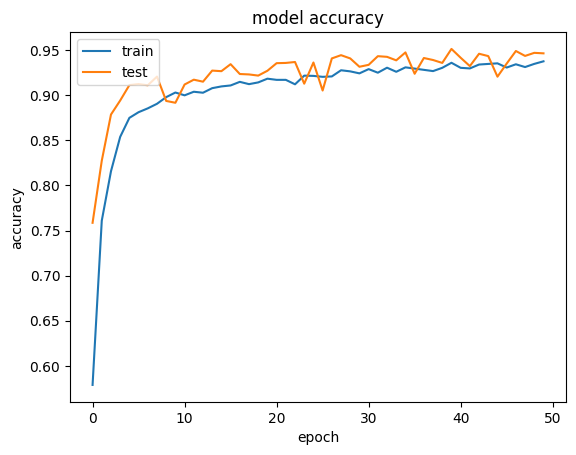

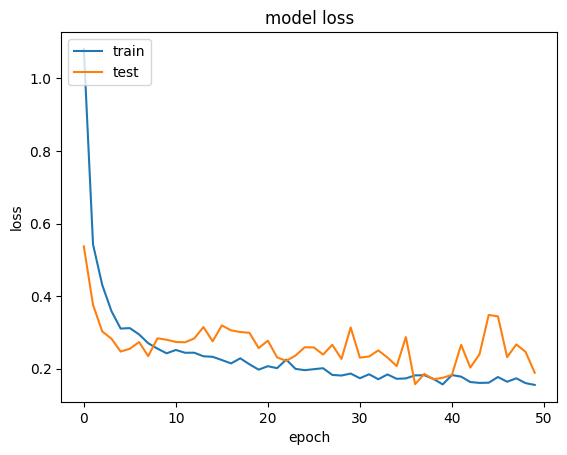

In [ ]:
plot_results(salinas_history)

In [ ]:
save_keras_model(salinas_model,"/content/drive/Shareddrives/satellite imagery/salinas_model")

## Classification using CNN based on "DEEP SUPERVISED LEARNING FOR HYPERSPECTRAL DATA CLASSIFICATION THROUGH CONVOLUTIONAL NEURAL NETWORKS" research paper

In [ ]:
# Hyperparameters
windowSize = 5
numPCAcomponents = 30
testRatio = 0.25
PATCH_SIZE = 5
C1 = 3*numPCAcomponents
numComponents = 30
# height = y.shape[0]
# width = y.shape[1]

In [ ]:
def oversampleWeakClasses(X, y):
    uniqueLabels, labelCounts = np.unique(y, return_counts=True)
    maxCount = np.max(labelCounts)
    labelInverseRatios = maxCount / labelCounts
    # repeat for every label and concat
    newX = X[y == uniqueLabels[0], :, :, :].repeat(round(labelInverseRatios[0]), axis=0)
    newY = y[y == uniqueLabels[0]].repeat(round(labelInverseRatios[0]), axis=0)
    for label, labelInverseRatio in zip(uniqueLabels[1:], labelInverseRatios[1:]):
        cX = X[y== label,:,:,:].repeat(round(labelInverseRatio), axis=0)
        cY = y[y == label].repeat(round(labelInverseRatio), axis=0)
        newX = np.concatenate((newX, cX))
        newY = np.concatenate((newY, cY))
    np.random.seed(seed=42)
    rand_perm = np.random.permutation(newY.shape[0])
    newX = newX[rand_perm, :, :, :]
    newY = newY[rand_perm]
    return newX, newY

In [ ]:
def applyPCA(X, numComponents=75):
    newX = np.reshape(X, (-1, X.shape[2]))
    pca = PCA(n_components=numComponents, whiten=True)
    newX = pca.fit_transform(newX)
    newX = np.reshape(newX, (X.shape[0],X.shape[1], numComponents))
    return newX, pca

In [ ]:
def standartizeData(X):
    newX = np.reshape(X, (-1, X.shape[2]))
    scaler = preprocessing.StandardScaler().fit(newX)
    newX = scaler.transform(newX)
    newX = np.reshape(newX, (X.shape[0],X.shape[1],X.shape[2]))
    return newX, scaler


In [ ]:
def padWithZeros(X, margin=2):
    newX = np.zeros((X.shape[0] + 2 * margin, X.shape[1] + 2* margin, X.shape[2]))
    x_offset = margin
    y_offset = margin
    newX[x_offset:X.shape[0] + x_offset, y_offset:X.shape[1] + y_offset, :] = X
    return newX


In [ ]:
def splitTrainTestSet(X, y, testRatio=0.10):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=testRatio, random_state=345,
                                                        stratify=y)
    return X_train, X_test, y_train, y_test

In [ ]:
def createPatches(X, y, windowSize=5, removeZeroLabels = True):
    margin = int((windowSize - 1) / 2)
    zeroPaddedX = padWithZeros(X, margin=margin)
    # split patches
    patchesData = np.zeros((X.shape[0] * X.shape[1], windowSize, windowSize, X.shape[2]))
    patchesLabels = np.zeros((X.shape[0] * X.shape[1]))
    patchIndex = 0
    for r in range(margin, zeroPaddedX.shape[0] - margin):
        for c in range(margin, zeroPaddedX.shape[1] - margin):
            patch = zeroPaddedX[r - margin:r + margin + 1, c - margin:c + margin + 1]
            patchesData[patchIndex, :, :, :] = patch
            patchesLabels[patchIndex] = y[r-margin, c-margin]
            patchIndex = patchIndex + 1
    if removeZeroLabels:
        patchesData = patchesData[patchesLabels>0,:,:,:]
        patchesLabels = patchesLabels[patchesLabels>0]
        patchesLabels -= 1
    return patchesData, patchesLabels


In [ ]:
def Patch(data,height_index,width_index):
    #transpose_array = data.transpose((2,0,1))
    #print transpose_array.shape
    height_slice = slice(height_index, height_index+PATCH_SIZE)
    width_slice = slice(width_index, width_index+PATCH_SIZE)
    patch = data[height_slice, width_slice, :]

    return patch

In [ ]:
def AugmentData(X_train):
    for i in range(int(X_train.shape[0]/2)):
        patch = X_train[i,:,:,:]
        num = random.randint(0,2)
        if (num == 0):

            flipped_patch = np.flipud(patch)
        if (num == 1):

            flipped_patch = np.fliplr(patch)
        if (num == 2):

            no = random.randrange(-180,180,30)
            flipped_patch = scipy.ndimage.interpolation.rotate(patch, no,axes=(1, 0),
                                                               reshape=False, output=None, order=3, mode='constant', cval=0.0, prefilter=False)


    patch2 = flipped_patch
    X_train[i,:,:,:] = patch2

    return X_train

In [ ]:
def preprocess_data_cnn(X,y,numComponents=numComponents,windowSize=windowSize,testRatio=testRatio,):
  X,pca = applyPCA(X,numComponents=numComponents)
  XPatches, yPatches = createPatches(X, y, windowSize=windowSize)
  X_train, X_test, y_train, y_test = splitTrainTestSet(XPatches, yPatches, testRatio)
  X_train, y_train = oversampleWeakClasses(X_train, y_train)
  X_train = AugmentData(X_train)
  return X_train, X_test, y_train, y_test

In [ ]:
from tensorflow.keras.optimizers.schedules import ExponentialDecay

def create_and_train_cnn_model(X_train, y_train_encoded, numPCAcomponents, C1, X_test, y_test,number_classes,epochs=15):
    model = Sequential()

    model.add(Conv2D(C1, (3, 3), activation='relu', input_shape=X_train[0].shape))
    model.add(Conv2D(3*C1, (3, 3), activation='relu'))
    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(6*numPCAcomponents, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(number_classes, activation='softmax'))

    lr_schedule = ExponentialDecay(
        initial_learning_rate=0.0001,
        decay_steps=100000,
        decay_rate=0.96,
        staircase=True)

    sgd = SGD(learning_rate=lr_schedule, momentum=0.9, nesterov=True)

    model.compile(loss='categorical_crossentropy', optimizer=sgd, metrics=['accuracy'])

    history = model.fit(X_train, y_train_encoded, batch_size=32, epochs=epochs, validation_split=0.1)

    return model, history


### Pavia University

In [ ]:
paviaU_X_train, paviaU_X_test,paviaU_y_train,  paviaU_y_test = preprocess_data_cnn(paviaU, paviaU_gt)


done
done
done
done


<ipython-input-12-e7218f350b10>:14: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  flipped_patch = scipy.ndimage.interpolation.rotate(patch, no,axes=(1, 0),


In [ ]:
paviaU_y_train_encoded = tf.keras.utils.to_categorical(paviaU_y_train, num_classes=9)
paviaU_y_test_encoded = tf.keras.utils.to_categorical(paviaU_y_test, num_classes=9)


In [ ]:
paviaU_cnn_model, paviaU_cnn_history = create_and_train_cnn_model(paviaU_X_train, paviaU_y_train_encoded, numPCAcomponents, C1, paviaU_X_test, paviaU_y_test,9)

Epoch 1/15
3602/3602 [==============================] - 33s 7ms/step - loss: 1.0321 - accuracy: 0.6483 - val_loss: 0.2977 - val_accuracy: 0.9246
Epoch 2/15
3602/3602 [==============================] - 20s 6ms/step - loss: 0.3234 - accuracy: 0.8884 - val_loss: 0.1501 - val_accuracy: 0.9517
Epoch 3/15
3602/3602 [==============================] - 23s 6ms/step - loss: 0.2055 - accuracy: 0.9289 - val_loss: 0.1067 - val_accuracy: 0.9624
Epoch 4/15
3602/3602 [==============================] - 26s 7ms/step - loss: 0.1551 - accuracy: 0.9467 - val_loss: 0.0854 - val_accuracy: 0.9696
Epoch 5/15
3602/3602 [==============================] - 27s 7ms/step - loss: 0.1272 - accuracy: 0.9567 - val_loss: 0.0714 - val_accuracy: 0.9751
Epoch 6/15
3602/3602 [==============================] - 22s 6ms/step - loss: 0.1071 - accuracy: 0.9633 - val_loss: 0.0633 - val_accuracy: 0.9783
Epoch 7/15
3602/3602 [==============================] - 16s 4ms/step - loss: 0.0943 - accuracy: 0.9687 - val_loss: 0.0549 - val_ac

In [ ]:
save_keras_model(paviaU_cnn_model,"/content/drive/Shareddrives/satellite imagery/paviaU_cnn_model")

In [ ]:
paviaU_cnn_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 3, 3, 90)          24390     
                                                                 
 conv2d_1 (Conv2D)           (None, 1, 1, 270)         218970    
                                                                 
 dropout (Dropout)           (None, 1, 1, 270)         0         
                                                                 
 flatten (Flatten)           (None, 270)               0         
                                                                 
 dense (Dense)               (None, 180)               48780     
                                                                 
 dropout_1 (Dropout)         (None, 180)               0         
                                                                 
 dense_1 (Dense)             (None, 9)                 1

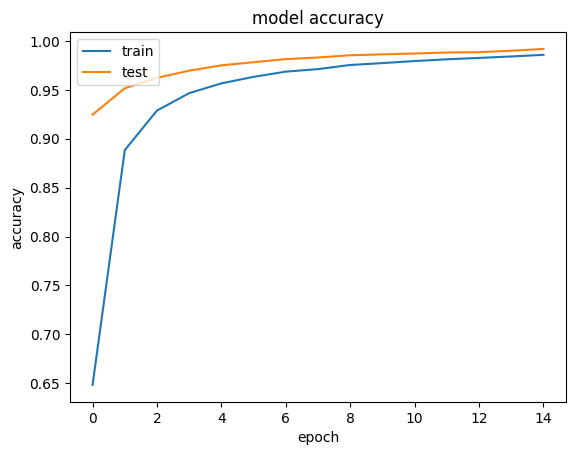

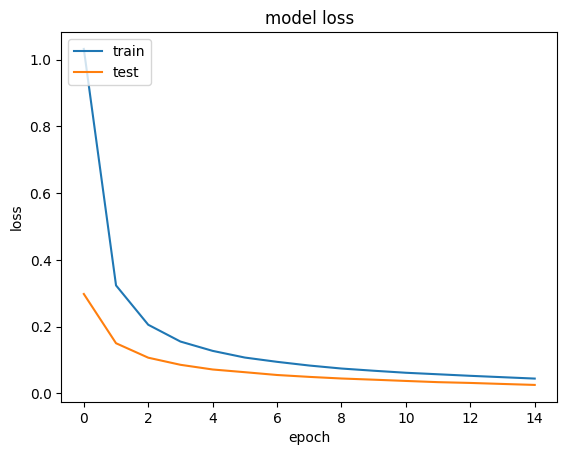

In [ ]:
plot_results(paviaU_cnn_history)

### Pavia Centre

In [ ]:
pavia_X_train, pavia_X_test,pavia_y_train,  pavia_y_test = preprocess_data_cnn(pavia, pavia_gt)

<ipython-input-14-e7218f350b10>:14: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  flipped_patch = scipy.ndimage.interpolation.rotate(patch, no,axes=(1, 0),


In [ ]:
pavia_y_train_encoded = tf.keras.utils.to_categorical(pavia_y_train, num_classes=9)
pavia_y_test_encoded = tf.keras.utils.to_categorical(pavia_y_test, num_classes=9)

In [ ]:
pavia_cnn_model, pavia_cnn_history = create_and_train_cnn_model(pavia_X_train, pavia_y_train_encoded, numPCAcomponents, C1, pavia_X_test, pavia_y_test,9,10)

Epoch 1/10
12953/12953 [==============================] - 58s 4ms/step - loss: 0.2984 - accuracy: 0.9131 - val_loss: 0.0313 - val_accuracy: 0.9918
Epoch 2/10
12953/12953 [==============================] - 53s 4ms/step - loss: 0.0435 - accuracy: 0.9884 - val_loss: 0.0172 - val_accuracy: 0.9950
Epoch 3/10
12953/12953 [==============================] - 54s 4ms/step - loss: 0.0270 - accuracy: 0.9928 - val_loss: 0.0119 - val_accuracy: 0.9964
Epoch 4/10
12953/12953 [==============================] - 54s 4ms/step - loss: 0.0192 - accuracy: 0.9947 - val_loss: 0.0087 - val_accuracy: 0.9975
Epoch 5/10
12953/12953 [==============================] - 52s 4ms/step - loss: 0.0152 - accuracy: 0.9959 - val_loss: 0.0067 - val_accuracy: 0.9982
Epoch 6/10
12953/12953 [==============================] - 57s 4ms/step - loss: 0.0123 - accuracy: 0.9968 - val_loss: 0.0053 - val_accuracy: 0.9986
Epoch 7/10
12953/12953 [==============================] - 55s 4ms/step - loss: 0.0101 - accuracy: 0.9975 - val_loss: 0

In [ ]:
save_keras_model(pavia_cnn_model,"/content/drive/Shareddrives/satellite imagery/pavia_cnn_model")

In [ ]:
pavia_cnn_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 3, 3, 90)          24390     
                                                                 
 conv2d_1 (Conv2D)           (None, 1, 1, 270)         218970    
                                                                 
 dropout (Dropout)           (None, 1, 1, 270)         0         
                                                                 
 flatten (Flatten)           (None, 270)               0         
                                                                 
 dense (Dense)               (None, 180)               48780     
                                                                 
 dropout_1 (Dropout)         (None, 180)               0         
                                                                 
 dense_1 (Dense)             (None, 9)                 1

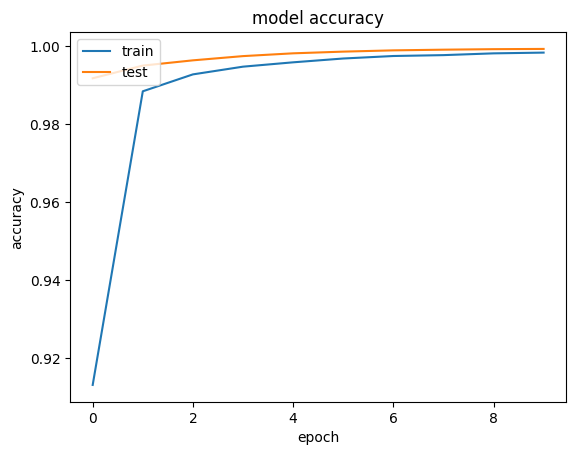

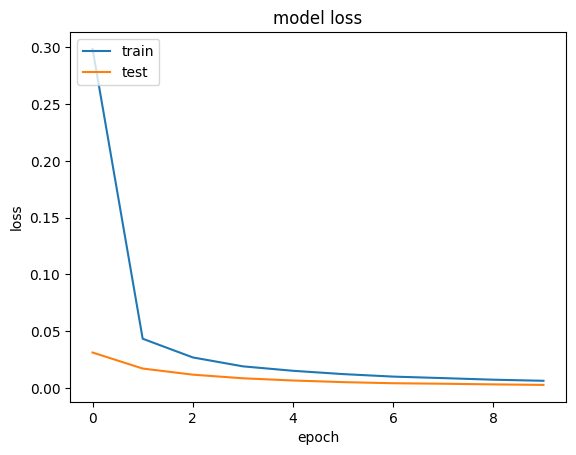

In [ ]:
plot_results(pavia_cnn_history)

### Indian Pines

In [ ]:
indian_pines_X_train, indian_pines_X_test,indian_pines_y_train, indian_pines_y_test = preprocess_data_cnn(indian_pines,indian_pines_gt)

<ipython-input-14-e7218f350b10>:14: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  flipped_patch = scipy.ndimage.interpolation.rotate(patch, no,axes=(1, 0),


In [ ]:
indian_pines_y_train_encoded = tf.keras.utils.to_categorical(indian_pines_y_train, num_classes=16)
indian_pines_y_test_encoded = tf.keras.utils.to_categorical(indian_pines_y_test, num_classes=16)

In [ ]:
indian_pines_cnn_model, indian_pines_cnn_history = create_and_train_cnn_model(indian_pines_X_train, indian_pines_y_train_encoded, numPCAcomponents, C1, indian_pines_X_test, indian_pines_y_test,16,40)

Epoch 1/40
835/835 [==============================] - 8s 8ms/step - loss: 2.4848 - accuracy: 0.2359 - val_loss: 1.9450 - val_accuracy: 0.5739
Epoch 2/40
835/835 [==============================] - 3s 4ms/step - loss: 1.7712 - accuracy: 0.4946 - val_loss: 1.2663 - val_accuracy: 0.6948
Epoch 3/40
835/835 [==============================] - 3s 4ms/step - loss: 1.2783 - accuracy: 0.6087 - val_loss: 0.8774 - val_accuracy: 0.7572
Epoch 4/40
835/835 [==============================] - 3s 4ms/step - loss: 1.0041 - accuracy: 0.6689 - val_loss: 0.6924 - val_accuracy: 0.8030
Epoch 5/40
835/835 [==============================] - 4s 5ms/step - loss: 0.8513 - accuracy: 0.7092 - val_loss: 0.5856 - val_accuracy: 0.8279
Epoch 6/40
835/835 [==============================] - 3s 4ms/step - loss: 0.7478 - accuracy: 0.7433 - val_loss: 0.5124 - val_accuracy: 0.8464
Epoch 7/40
835/835 [==============================] - 3s 4ms/step - loss: 0.6704 - accuracy: 0.7680 - val_loss: 0.4578 - val_accuracy: 0.8602
Epoch 

In [ ]:
save_keras_model(indian_pines_cnn_model,"/content/drive/Shareddrives/satellite imagery/indian_pines_cnn_model")

In [ ]:
indian_pines_cnn_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 3, 3, 90)          24390     
                                                                 
 conv2d_3 (Conv2D)           (None, 1, 1, 270)         218970    
                                                                 
 dropout_2 (Dropout)         (None, 1, 1, 270)         0         
                                                                 
 flatten_1 (Flatten)         (None, 270)               0         
                                                                 
 dense_2 (Dense)             (None, 180)               48780     
                                                                 
 dropout_3 (Dropout)         (None, 180)               0         
                                                                 
 dense_3 (Dense)             (None, 16)               

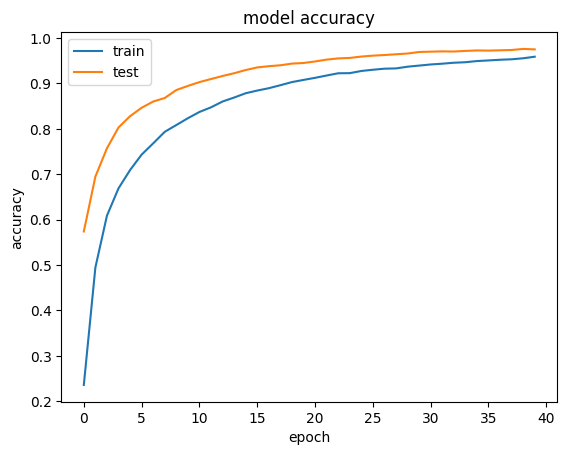

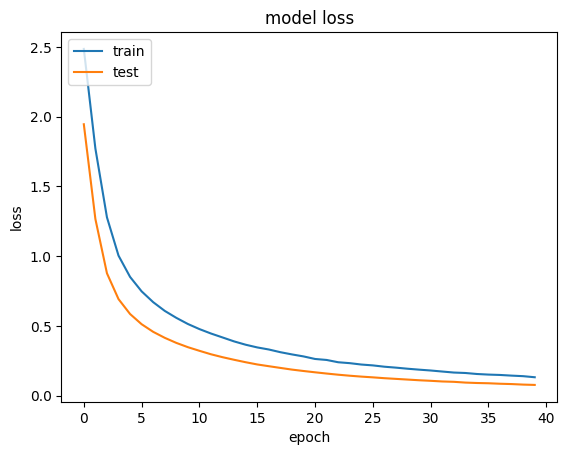

In [ ]:
plot_results(indian_pines_cnn_history)

### Salinas

In [ ]:
salinas_X_train, salinas_X_test,salinas_y_train,salinas_y_test = preprocess_data_cnn(salinas,salinas_gt)

<ipython-input-14-e7218f350b10>:14: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  flipped_patch = scipy.ndimage.interpolation.rotate(patch, no,axes=(1, 0),


In [ ]:
salinas_y_train_encoded = tf.keras.utils.to_categorical(salinas_y_train, num_classes=16)
salinas_y_test_encoded = tf.keras.utils.to_categorical(salinas_y_test, num_classes=16)

In [ ]:
salinas_cnn_model, salinas_cnn_history = create_and_train_cnn_model(salinas_X_train, salinas_y_train_encoded, numPCAcomponents, C1, indian_pines_X_test, salinas_y_test,16,10)

Epoch 1/10
3893/3893 [==============================] - 17s 4ms/step - loss: 0.9598 - accuracy: 0.7277 - val_loss: 0.1264 - val_accuracy: 0.9707
Epoch 2/10
3893/3893 [==============================] - 19s 5ms/step - loss: 0.1782 - accuracy: 0.9482 - val_loss: 0.0744 - val_accuracy: 0.9743
Epoch 3/10
3893/3893 [==============================] - 16s 4ms/step - loss: 0.1133 - accuracy: 0.9648 - val_loss: 0.0602 - val_accuracy: 0.9765
Epoch 4/10
3893/3893 [==============================] - 17s 4ms/step - loss: 0.0928 - accuracy: 0.9699 - val_loss: 0.0513 - val_accuracy: 0.9796
Epoch 5/10
3893/3893 [==============================] - 17s 4ms/step - loss: 0.0769 - accuracy: 0.9741 - val_loss: 0.0448 - val_accuracy: 0.9814
Epoch 6/10
3893/3893 [==============================] - 16s 4ms/step - loss: 0.0676 - accuracy: 0.9764 - val_loss: 0.0400 - val_accuracy: 0.9835
Epoch 7/10
3893/3893 [==============================] - 17s 4ms/step - loss: 0.0604 - accuracy: 0.9787 - val_loss: 0.0363 - val_ac

In [ ]:
save_keras_model(salinas_cnn_model,"/content/drive/Shareddrives/satellite imagery/salinas_cnn_model")

In [ ]:
salinas_cnn_model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 3, 3, 90)          24390     
                                                                 
 conv2d_9 (Conv2D)           (None, 1, 1, 270)         218970    
                                                                 
 dropout_8 (Dropout)         (None, 1, 1, 270)         0         
                                                                 
 flatten_4 (Flatten)         (None, 270)               0         
                                                                 
 dense_8 (Dense)             (None, 180)               48780     
                                                                 
 dropout_9 (Dropout)         (None, 180)               0         
                                                                 
 dense_9 (Dense)             (None, 16)               

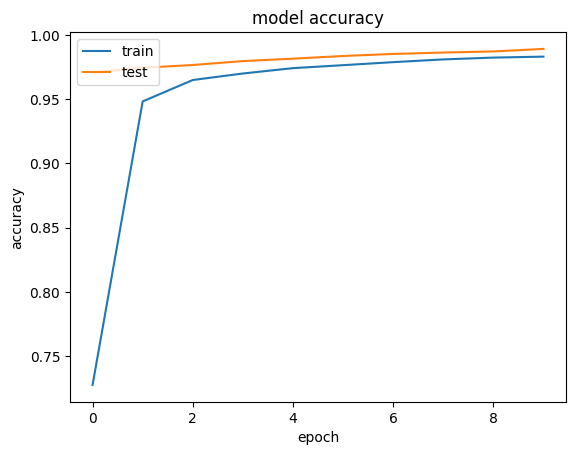

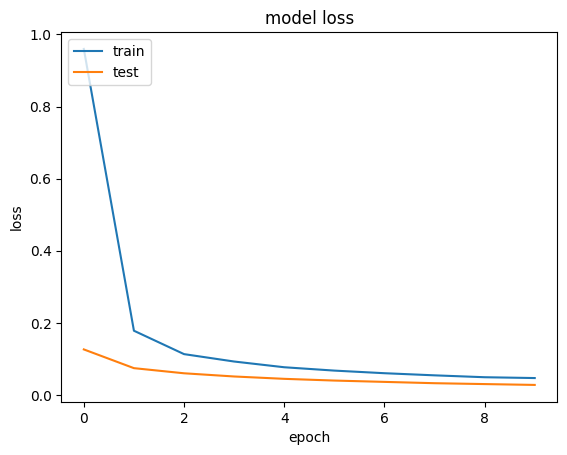

In [ ]:
plot_results(salinas_cnn_history)